# Detecção de Baleias com HoG + SVM

## Inicialização

In [3]:
!nvidia-smi

Sun Jun 29 00:42:09 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.127.05             Driver Version: 550.127.05     CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA H100 80GB HBM3          On  |   00000000:1B:00.0 Off |                    0 |
| N/A   26C    P0             68W /  700W |       4MiB /  81559MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [4]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
!nvcc --version

try:
    import google.colab
    _ON_COLAB = True
except:
    _ON_COLAB = False

print('Running on Google Colab = ', _ON_COLAB)
import os
import torch
from IPython import get_ipython
import os
# Definir o caminho base
if _ON_COLAB:
    BASE_PATH = "/content"
    import locale
    locale.getpreferredencoding = lambda: "UTF-8"
else:
    BASE_PATH = "/lapix" # trocar para o base path do seu computador se estiver rodando localmente, deixar /lapix se estiver rodando nos conteiners lapix
    VISIBLE_GPUS = [3] # Selecionar a GPU PARA RODAR! VER QUAL ESTA LIVRE

    if torch.cuda.device_count() != 8:
        print("GPU SETADA - PULANDO ETAPA")
    else:
        os.environ["CUDA_VISIBLE_DEVICES"] = str(VISIBLE_GPUS).replace("]", "").replace("[","").replace(" ", "")
        os.environ["NVIDIA_VISIBLE_DEVICES"] = str(VISIBLE_GPUS).replace("]", "").replace("[","").replace(" ", "")
        print("CUDA GPUS NUMBER: ", torch.cuda.device_count())
    
os.chdir(BASE_PATH) # garantir que está executando no caminho base definido

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Mar_28_02:18:24_PDT_2024
Cuda compilation tools, release 12.4, V12.4.131
Build cuda_12.4.r12.4/compiler.34097967_0
Running on Google Colab =  False
CUDA GPUS NUMBER:  1


In [5]:
import numpy as np
import os
from PIL import Image
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import cv2

## Carregamento dos datasets e inicialização do HoG

In [ ]:
# Define paths
#pos_im_path - Happy Whale dataset
#neg_im_path - Imagens do mar
pos_im_path = 'arquivos/Object-detection-via-HOG-SVM/data/positive'
neg_im_path = 'arquivos/Object-detection-via-HOG-SVM/data/negative'

# --- PARAMETERS ---
orientations = 10
pixels_per_cell = (32, 32)  
cells_per_block = (3, 3)
window_sizes = [(128, 128), (192, 192), (256, 256)]  
step_size = 32  
data = []
labels = []

for path, label in [(pos_im_path, 1), (neg_im_path, 0)]:
    for file in os.listdir(path):
        full_path = os.path.join(path, file)
        if not os.path.isfile(full_path):
            continue
        if not file.lower().endswith(('.png', '.jpg', '.jpeg')):
            continue
        img = Image.open(full_path).convert('L')
        img = img.resize((128, 128))  
        fd = hog(img, orientations, pixels_per_cell, cells_per_block,
                 block_norm='L2', feature_vector=True)
        data.append(fd)
        labels.append(label)

le = LabelEncoder()
labels = le.fit_transform(labels)

## Treinamento com SVM

In [7]:
# --- TRAIN SVM ---
print("Constructing training/testing split...")
(trainData, testData, trainLabels, testLabels) = train_test_split(
    np.array(data), labels, test_size=0.20, random_state=42)

print("Training Linear SVM classifier...")
model = LinearSVC(max_iter=10000)
model.fit(trainData, trainLabels)

print("Evaluating classifier on test data ...")
predictions = model.predict(testData)
print(classification_report(testLabels, predictions))

Constructing training/testing split...
Training Linear SVM classifier...
Evaluating classifier on test data ...
              precision    recall  f1-score   support

           0       0.99      0.98      0.98       701
           1       0.99      1.00      0.99      1454

    accuracy                           0.99      2155
   macro avg       0.99      0.99      0.99      2155
weighted avg       0.99      0.99      0.99      2155



## Análise de métricas com Matriz de Confusão

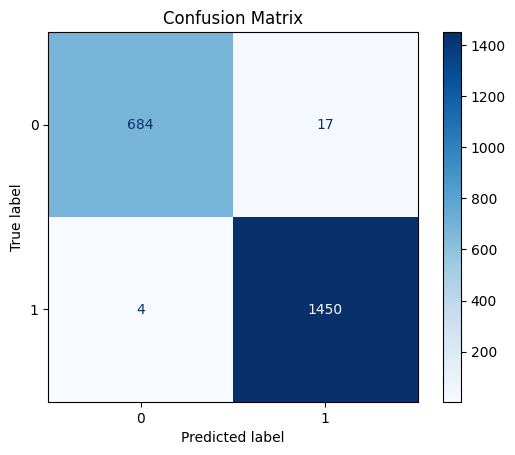

In [39]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute the confusion matrix
cm = confusion_matrix(testLabels, predictions)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.show()

## Salvar e carregar modelo em arquivo .pkl

In [8]:
import joblib

# Save the trained SVM model and the label encoder to disk
joblib.dump(model, "arquivos/Object-detection-via-HOG-SVM/data/svm_whale_detector.pkl")
joblib.dump(le, "arquivos/Object-detection-via-HOG-SVM/data/label_encoder.pkl")

print("Model and label encoder saved successfully.")

Model and label encoder saved successfully.


In [ ]:
import joblib

# Loading the models
joblib.load(model, "arquivos/Object-detection-via-HOG-SVM/data/svm_whale_detector.pkl")
joblib.load(le, "arquivos/Object-detection-via-HOG-SVM/data/label_encoder.pkl")

print("Model and label loaded.")

## Funções para detecção com base no modelo treinado

### Sliding window

In [40]:
# --- SLIDING WINDOW ---
def sliding_window(image, stepSize, windowSize):
    for y in range(0, image.shape[0] - windowSize[1] + 1, stepSize):
        for x in range(0, image.shape[1] - windowSize[0] + 1, stepSize):
            yield (x, y, image[y:y + windowSize[1], x:x + windowSize[0]])

### Non Max Suppresion

In [41]:
# --- NON-MAX SUPPRESSION ---
def non_max_suppression_fast(boxes, scores, overlapThresh=0.3):
    if len(boxes) == 0:
        return []
    boxes = np.array(boxes)
    scores = np.array(scores)
    pick = []
    x1 = boxes[:,0]
    y1 = boxes[:,1]
    x2 = boxes[:,2]
    y2 = boxes[:,3]
    area = (x2 - x1 + 1) * (y2 - y1 + 1)
    idxs = np.argsort(scores)
    while len(idxs) > 0:
        last = idxs[-1]
        pick.append(last)
        xx1 = np.maximum(x1[last], x1[idxs[:-1]])
        yy1 = np.maximum(y1[last], y1[idxs[:-1]])
        xx2 = np.minimum(x2[last], x2[idxs[:-1]])
        yy2 = np.minimum(y2[last], y2[idxs[:-1]])
        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)
        overlap = (w * h) / area[idxs[:-1]]
        idxs = np.delete(
            idxs, np.concatenate(([len(idxs) - 1], np.where(overlap > overlapThresh)[0]))
        )
    return boxes[pick].astype("int"), scores[pick]


### Função de Detecção

In [42]:
# --- DETECTION FUNCTION ---
def detect_objects(img_path, model):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    boxes = []
    scores = []

    for windowSize in window_sizes:
        for (x, y, window) in sliding_window(gray, step_size, windowSize):
            if window.shape[0] != windowSize[1] or window.shape[1] != windowSize[0]:
                continue
            window_resized = cv2.resize(window, (128, 128))
            fd = hog(window_resized, orientations, pixels_per_cell, cells_per_block,
                     block_norm='L2', feature_vector=True)
            score = model.decision_function([fd])[0]
            if score > 0:  # Only keep positive SVM scores
                boxes.append((x, y, x+windowSize[0], y+windowSize[1]))
                scores.append(score)

    # NMS to filter overlapping boxes
    nms_boxes, nms_scores = non_max_suppression_fast(boxes, scores, overlapThresh=0.3)

    # Draw only the best box (highest score)
    if len(nms_boxes) > 0:
        best_idx = np.argmax(nms_scores)
        x1, y1, x2, y2 = nms_boxes[best_idx]
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 3)

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Detected Whale")
    plt.show()

### Testes

Processing DSC01082.JPG...


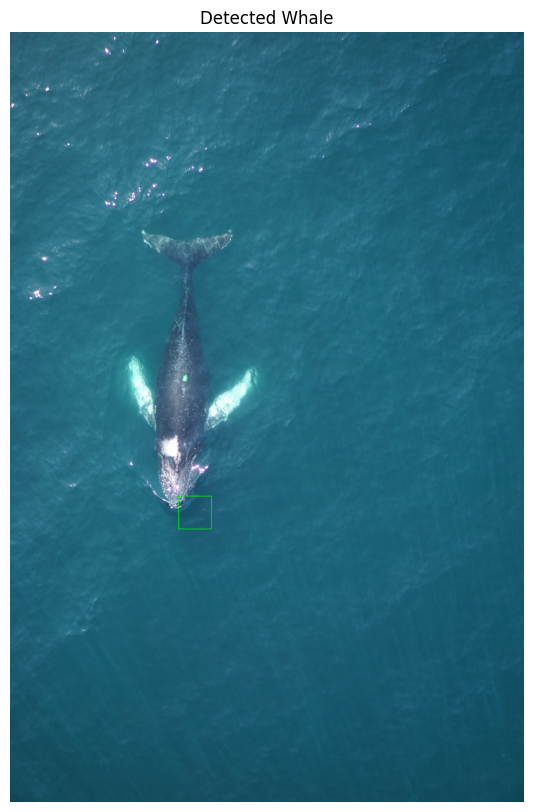

Processing DSC04878.JPG...


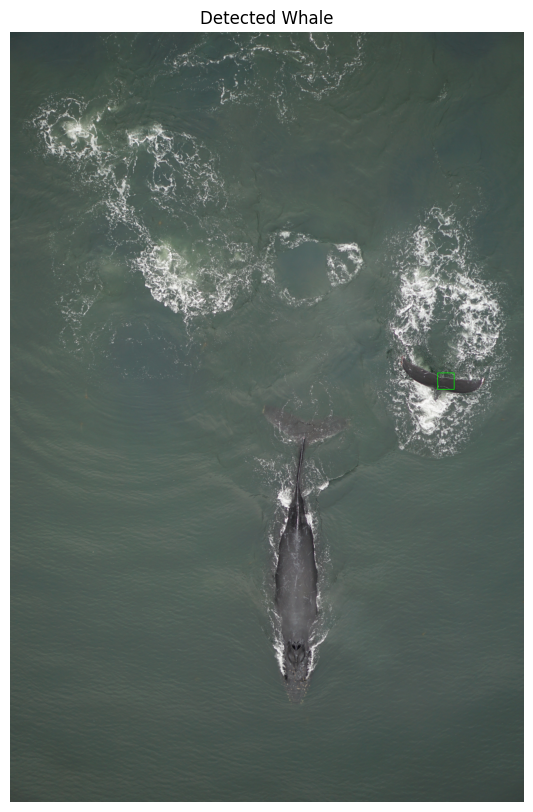

Processing DSC04952.JPG...


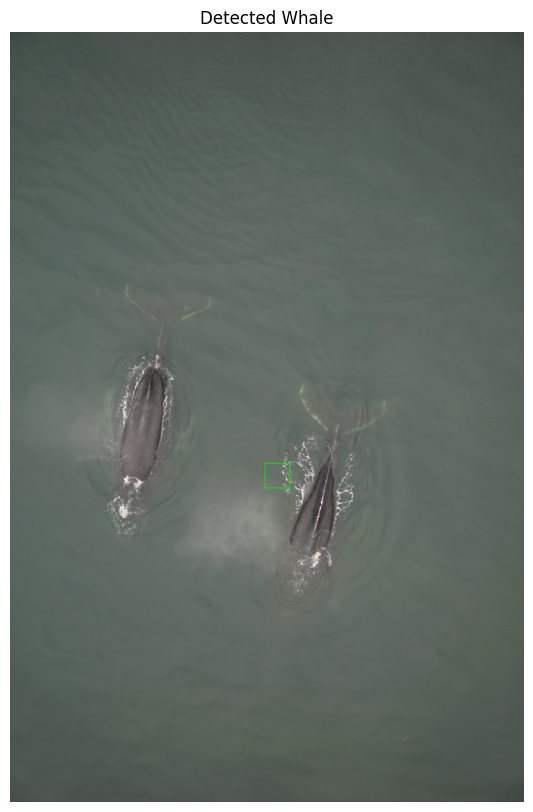

Processing DSC09869.JPG...


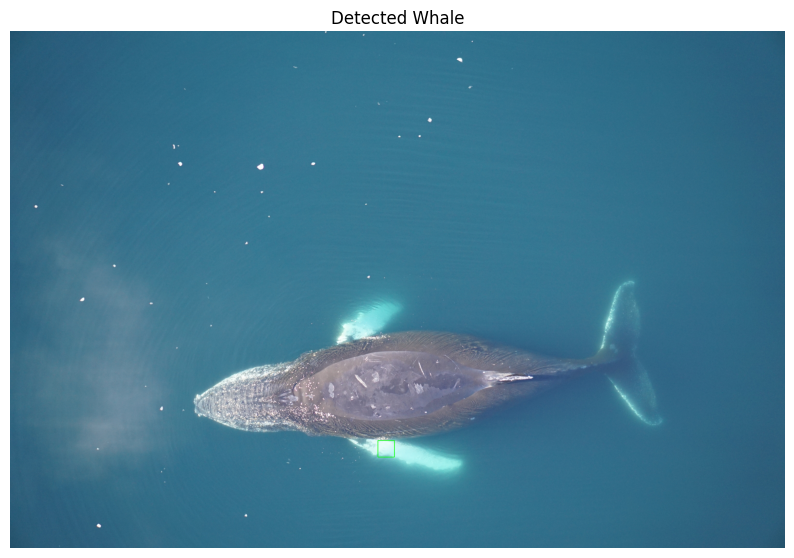

Processing DSC00948.JPG...


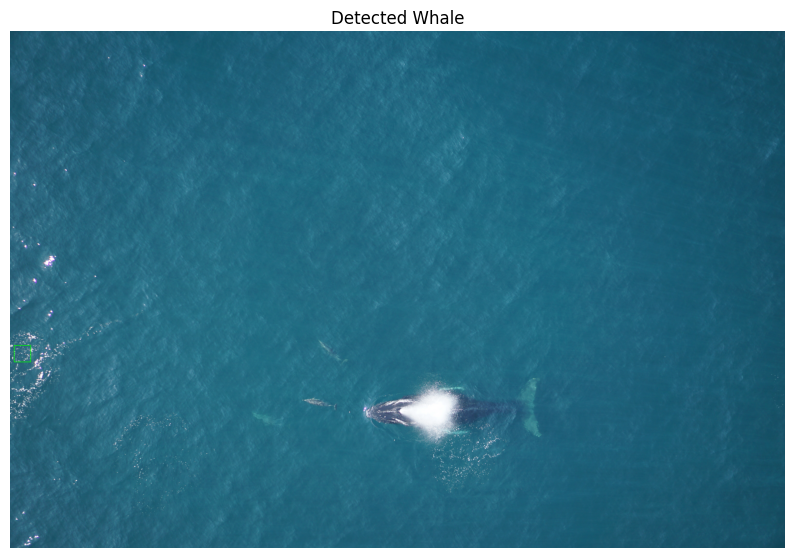

Processing DSC09223.JPG...


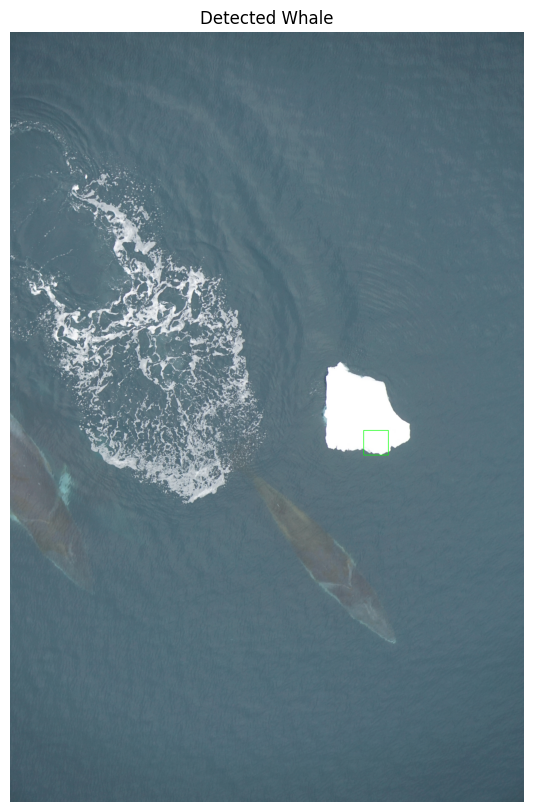

Processing DSC01565.JPG...


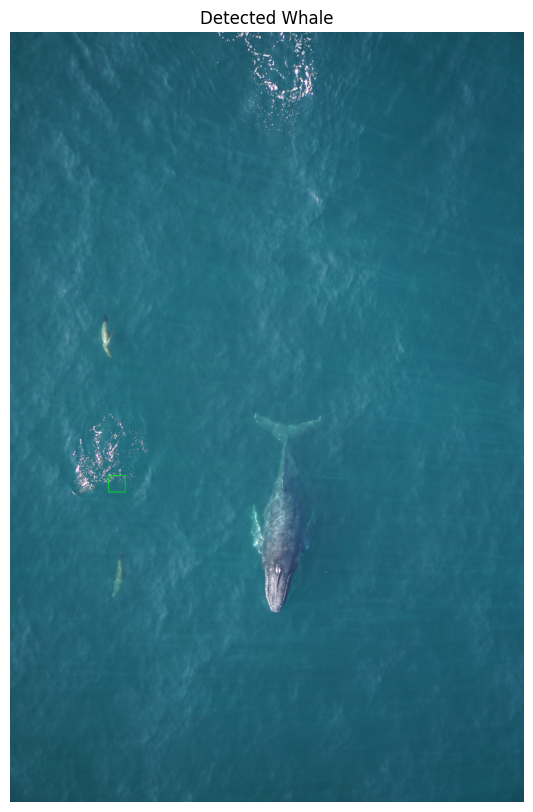

Processing DSC00724.JPG...


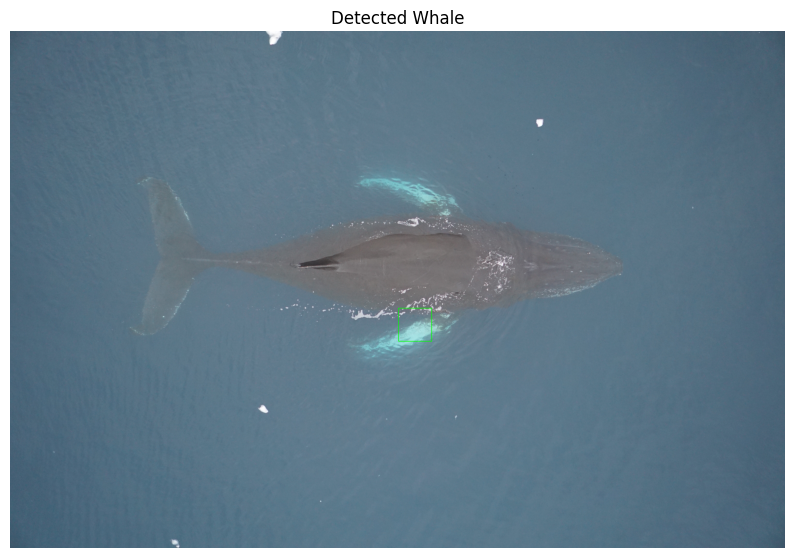

Processing DSC04596.JPG...


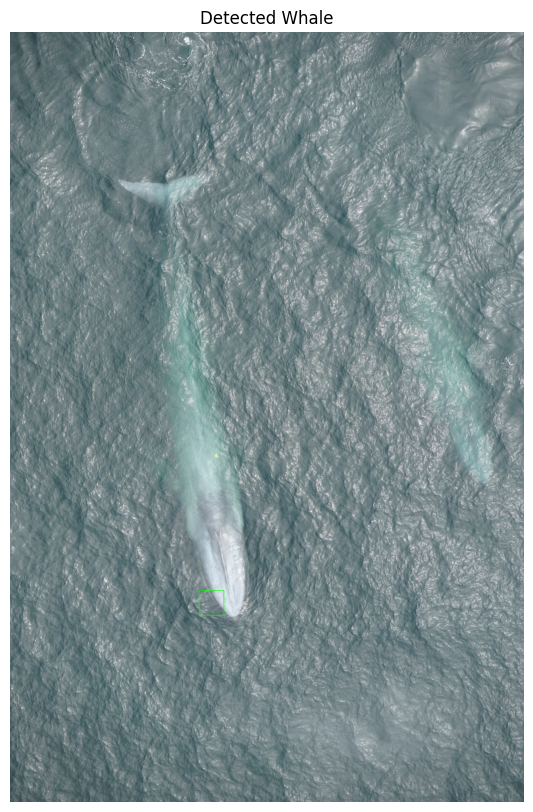

Processing DSC04947.JPG...


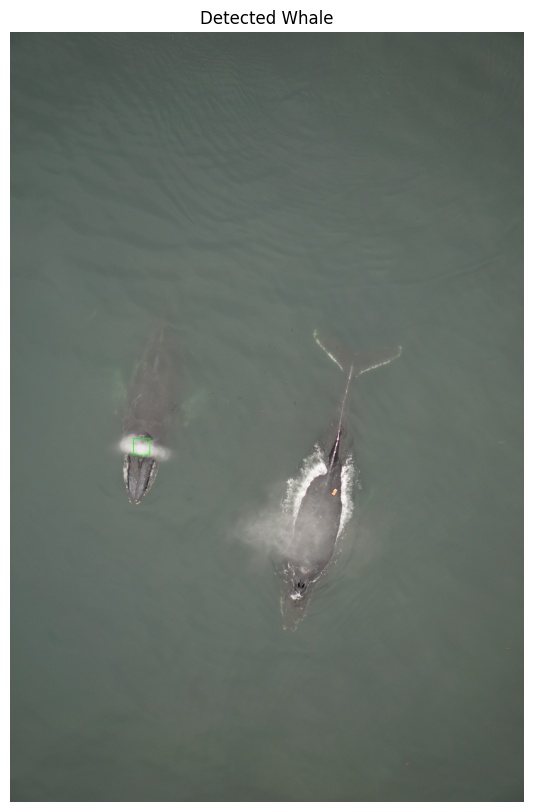

Processing DSC09233.JPG...


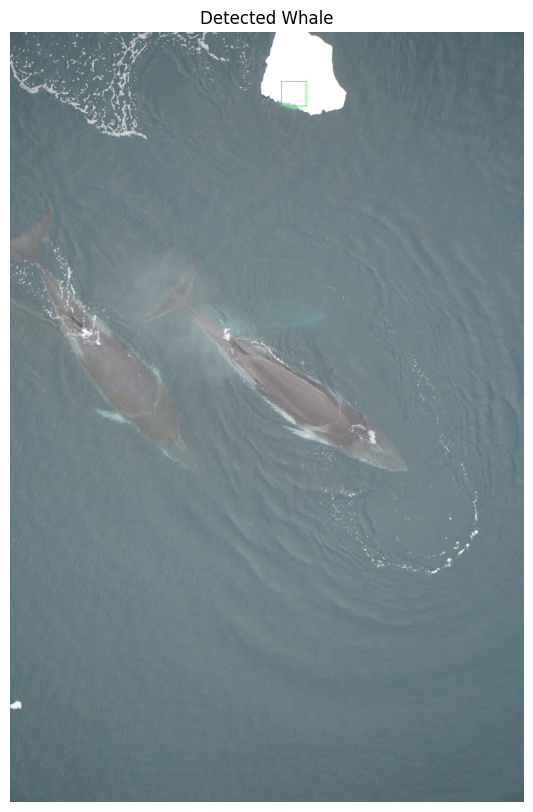

Processing DSC03868.JPG...


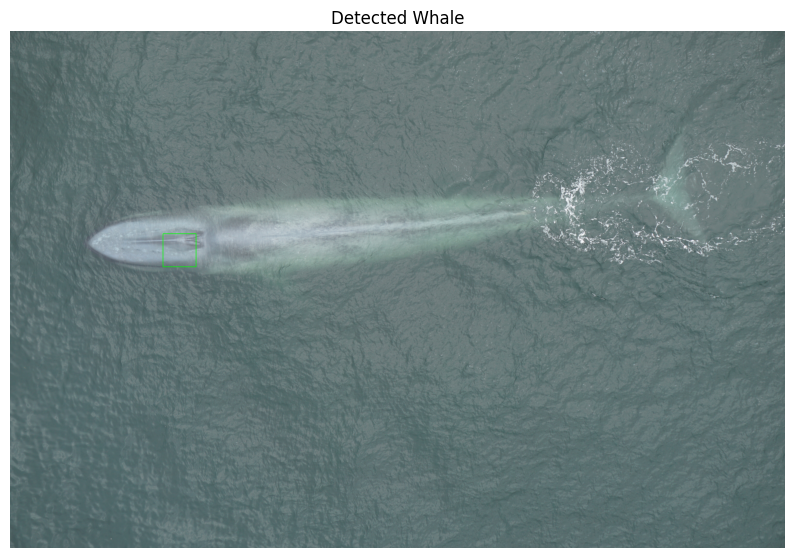

Processing DSC09056.JPG...


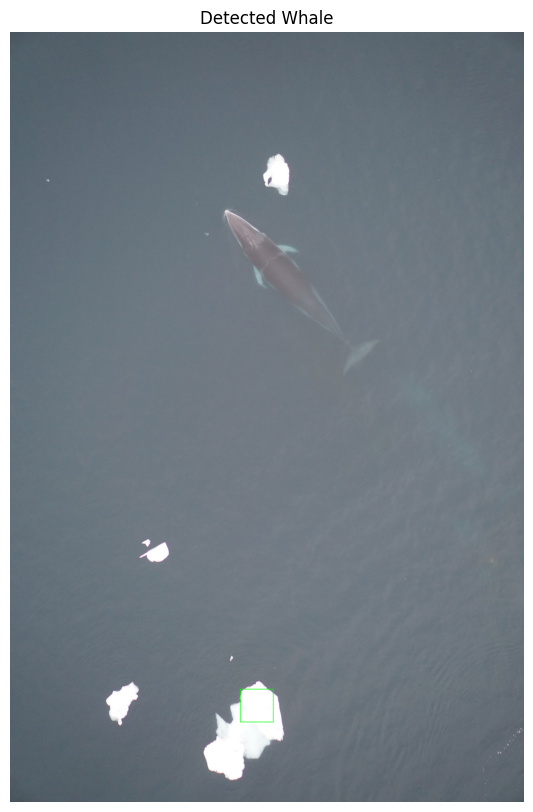

Processing DSC03331.JPG...


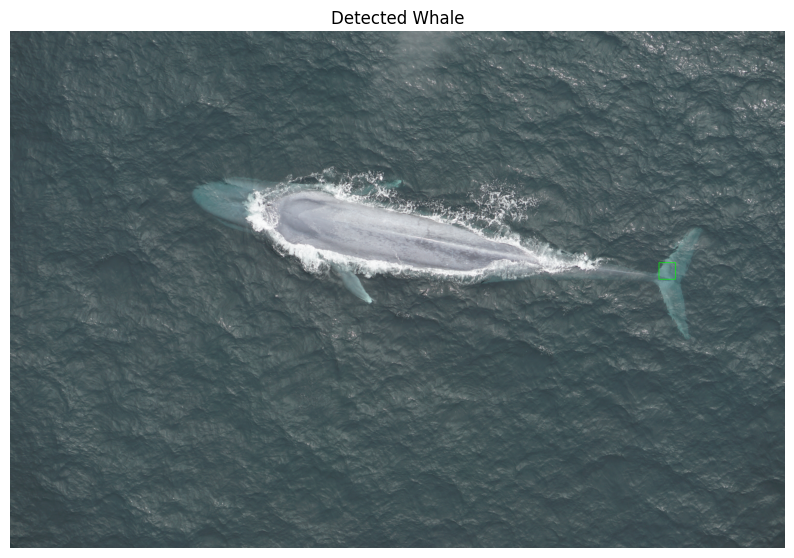

Processing DSC04832.JPG...


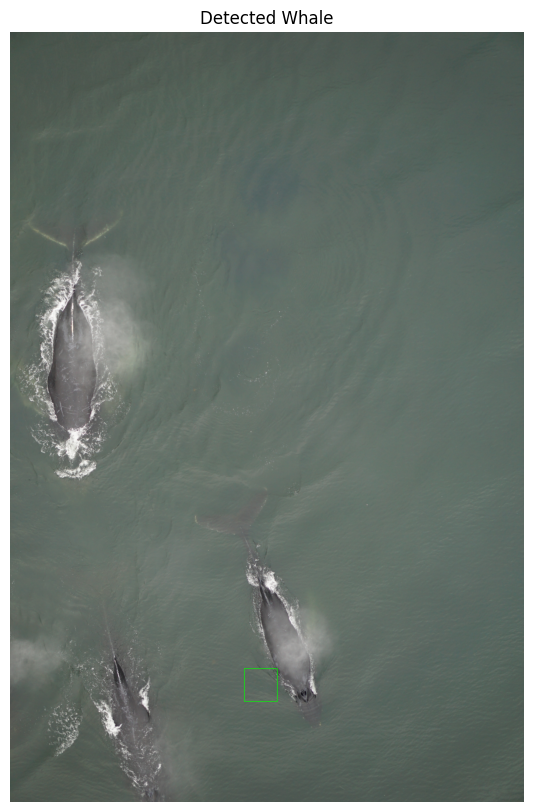

In [43]:
import os
import random

test_dir = 'arquivos/Object-detection-via-HOG-SVM/data/whale_test'  # directory containing 40 test images
output_dir = 'arquivos/Object-detection-via-HOG-SVM/data/output_detections'
os.makedirs(output_dir, exist_ok=True)

# Filter valid image files
valid_ext = ('.jpg', '.png', '.jpeg', '.bmp')
image_files = [f for f in os.listdir(test_dir) if f.lower().endswith(valid_ext)]

# Pick 10 random images
sampled_files = random.sample(image_files, 15)

# Process each selected image
for filename in sampled_files:
    image_path = os.path.join(test_dir, filename)
    print(f"Processing {filename}...")
    detect_objects(image_path, model)